# Import Statements

In [1]:
# !pip freeze >> requirements.txt
!pip uninstall opencv-python==3.4.2.17 
!pip install opencv-python==3.4.2.17 
!pip install opencv-contrib-python==3.4.2.17 

Uninstalling opencv-python-4.1.2.30:
  Would remove:
    /usr/local/lib/python3.7/dist-packages/cv2/*
    /usr/local/lib/python3.7/dist-packages/opencv_python-4.1.2.30.dist-info/*
Proceed (y/n)? y
  Successfully uninstalled opencv-python-4.1.2.30
     |████████████████████████████████| 25.0MB 1.4MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
     |████████████████████████████████| 30.6MB 143kB/s 
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import joblib
import pickle
import pandas as pd 
from google.colab.patches import cv2_imshow
import shutil
import scipy.cluster.vq as vq
from scipy.spatial import distance
from scipy import spatial
import random
from PIL import Image

In [3]:
import cv2
from sklearn.cluster import KMeans
sift = cv2.xfeatures2d.SIFT_create()

In [4]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


# Saving and Loading models


In [5]:
# Saving and Loading models using joblib
def save(filename, obj):
  with open(filename, 'wb') as handle:
      joblib.dump(obj, handle, protocol=pickle.HIGHEST_PROTOCOL)

def load(filename):
  with open(filename, 'rb') as handle:
      return joblib.load(filename)


# Paths and Arguments 

In [6]:
class Args():
  def __init__(self,data_path,original_all_img_path_rel , original_all_img_root ,  dataset):
    
    self.train_bovw_feature = os.path.join(data_path,'train_bovw_feature.pkl')

    self.train_sift =  os.path.join(data_path,'train_sift.pkl')
    self.train_sift_names = os.path.join(data_path,'train_sift_names.pkl')

    self.train_names = os.path.join(data_path,'train_names.pkl')
    self.test_names = os.path.join(data_path,'test_names.pkl')
    
    self.visual_words = os.path.join(data_path,'visual_words.pkl')
    self.hist_train = os.path.join(data_path,'hist_train.pkl')
    self.ground_truth = os.path.join(data_path,dataset +'_GT_final')

    self.reduce_train_names = os.path.join(data_path,'reduce_train_names.pkl')
    self.reduce_train_sift = os.path.join(data_path,'reduce_train_sift.pkl')
    
    self.ranking_one_path = os.path.join(data_path)

    self.dataset_root =  original_all_img_root
    self.original_train_folder_name = original_all_img_path_rel
    self.original_test_folder_name = original_all_img_path_rel

    self.datasetName = dataset

    self.all_original_images = '/content/drive/MyDrive/SUB/PROJECTS/IR_final/datasets/all_images/'+ dataset +'/'


# Datasets and Loading required files 

In [7]:
# my_paths = Args('/content/drive/MyDrive/SUB/PROJECTS/IR_final/models/baseline_ml_model/paris','paris/' , '/content/drive/MyDrive/SUB/PROJECTS/IR_final/datasets/all_images/' ,  'paris')
my_paths = Args('/content/drive/MyDrive/SUB/PROJECTS/IR_final/models/baseline_ml_model/oxford','oxford/' , '/content/drive/MyDrive/SUB/PROJECTS/IR_final/datasets/all_images/' ,  'oxford')
# my_paths = Args('/content/drive/MyDrive/SUB/PROJECTS/IR_final/models/baseline_ml_model/instre','instre/' , '/content/drive/MyDrive/SUB/PROJECTS/IR_final/datasets/all_images/' ,  'instre)
# my_paths = Args('/content/drive/MyDrive/SUB/PROJECTS/IR_final/models/baseline_ml_model/sculptures','sculptures/' , '/content/drive/MyDrive/SUB/PROJECTS/IR_final/datasets/all_images/' ,  'sculptures')

In [8]:
train_bovw_feature = my_paths.train_bovw_feature 

train_sift = load(my_paths.train_sift)
train_sift_names = load(my_paths.train_sift_names)

train_names = load(my_paths.train_names)
test_names = load(my_paths.test_names)

visual_words = load(my_paths.visual_words)
hist_train = load(my_paths.hist_train)
ground_truth = load(my_paths.ground_truth)
reduce_train_names = load(my_paths.reduce_train_names)
reduce_train_sift = load(my_paths.reduce_train_sift)

ranking_one_path = my_paths.ranking_one_path

dataset_root = my_paths.dataset_root
original_train_folder_name = my_paths.original_train_folder_name
original_test_folder_name = my_paths.original_test_folder_name

In [9]:
filter_train_img_names = [i[:i.index('.')] for i in train_names]
filter_test_img_names = [i[:i.index('.')] for i in test_names]

original_data_path = my_paths.all_original_images 

# Display Images in Dataset 

In [10]:
def display_image_converted(img_path, isTrain=True):
  full_path = cv2.imread(os.path.join(dataset_root+ original_test_folder_name,img_path))
  if full_path is None:
    full_path = cv2.imread(os.path.join(dataset_root+ original_test_folder_name,img_path))
  plt.imshow(full_path,cmap='gray')
  plt.xlabel(img_path)
  plt.show()

def display_image_original(img_path, isTrain=True):
  full_path = cv2.imread(os.path.join(dataset_root+ original_test_folder_name,img_path))
  if full_path is None:
    full_path = cv2.imread(os.path.join(dataset_root+ original_test_folder_name,img_path))
  plt.imshow(full_path,cmap='gray')
  plt.xlabel(img_path)
  plt.show()

# print(f'No. of images ={len(train_names)}')
# for img_name in train_names[:2]:
#   display_image_original(img_name)
#   display_image_converted(img_name)

# Utility functions 

## SIFT

In [11]:
def sift_features(images, names):
  descriptor_list = []
  sift_per_image = []
  image_name = []
  for idx, img in enumerate(images):
    kp, des = sift.detectAndCompute(img,None)
    if des is not None:
      descriptor_list.extend(des)
      image_name.extend(names[idx])
      sift_per_image.append(des)
    else:
      print(f'sift not created for {names[idx]}')
  return descriptor_list, sift_per_image, image_name


## Histogram related functions 

In [12]:
def input_vector_encoder(feature, codebook):
    code, _ = vq.vq(feature, codebook.tolist())
    word_hist, bin_edges = np.histogram(code, bins=range(codebook.shape[0] + 1), normed=True)
    return word_hist

def image_class(all_bovw, centers):
     return [input_vector_encoder(img, centers) for img in all_bovw if img is not None]      

def get_filter_sift(sifts, names):
  filter_sifts, filter_names = [], []
  for sif, name in zip(sifts, names):
    if sif is not None:
      filter_sifts.append(sif)
      filter_names.append(name)
  return filter_sifts, filter_names


## Similarity and matching 

In [13]:
def cosineSimilarity(images_bow,query_bow):
  l2_norm_db = np.sum(np.abs(images_bow)**2,axis=-1)**(1./2)
  l2_norm_db =l2_norm_db.reshape((l2_norm_db.shape[0],1))
  l2_norm_query = np.sum(np.abs(query_bow)**2,axis=-1)**(1./2)
  l2_norm_query =l2_norm_query.reshape((l2_norm_query.shape[0],1))
  l2_norm = l2_norm_db * l2_norm_query
  dot_product = images_bow @ query_bow.T
  cosine_similarity = dot_product/l2_norm
  return cosine_similarity

def apply_weighted_cosineSimilarity(images_bow,query_bow, th = 0.8):
  weights = np.ones(query_bow.shape[1])
  for idx,ele in enumerate(query_bow[0]):
    if ele == 0:
      weights[idx] = th 

  l2_norm_db = np.sum(weights * np.abs(images_bow)**2,axis=-1)**(1./2)
  l2_norm_db =l2_norm_db.reshape((l2_norm_db.shape[0],1))
  l2_norm_query = np.sum(weights * np.abs(query_bow)**2,axis=-1)**(1./2)
 
  l2_norm_query =l2_norm_query.reshape((l2_norm_query.shape[0],1))
  
  l2_norm = l2_norm_db * l2_norm_query
  
  mul = query_bow[0]* weights
  mul = np.reshape(mul, (1,mul.shape[0]))
  dot_product = images_bow @ (mul).T
  
  
  cosine_similarity = dot_product/l2_norm
  
  return cosine_similarity

def topNmatches(images_bow, query_bow,dist_type='cosine',N = 200):
  if dist_type == 'cosine':
    cosine_similarity = cosineSimilarity(images_bow,query_bow)
  else:
    cosine_similarity = apply_weighted_cosineSimilarity(images_bow,query_bow, th = 0.8)

  highest_matching_image_indices = np.argsort(cosine_similarity,axis = 0)[::-1][:cosine_similarity.shape[0]]
  highest_matching_image_indices = highest_matching_image_indices.reshape((highest_matching_image_indices.shape[0],))
  return highest_matching_image_indices[0:N]

def ret_index(img_names, q_name):
  for idx, name in enumerate(img_names):
    if name == q_name:
      return idx
  return -1

def display_image(img_path):
  full_path = cv2.imread(os.path.join(dataset_root+ original_train_folder_name,img_path))
  if full_path is None:
    full_path = cv2.imread(os.path.join(dataset_root+ original_test_folder_name,img_path))
  plt.imshow(full_path,cmap='gray')
  plt.xlabel(img_path)
  plt.show()


# Evaluation 

## MAP

In [14]:
# labelled array is an array of 0,1,0,1  and rev_idx gives number of relevant docs to be considered for mean avg precision
def find_MAP(labelled_arr, rev_idx):
  count = 0
  rel = 0
  true_pre = 0
  rel_enc = 0
  for label in labelled_arr:
    count = count + 1
    if rel_enc < rev_idx:
      if label == 1:
        rel_enc = rel_enc + 1
        rel = rel + 1 
        true_pre = true_pre + rel/count 
      # print("true Precision for relevant query for label", rel/count )
  #print("count", count)  
  if rel == 0:
    return 0
  else:
    avgPre = true_pre/(rel)
    
    return avgPre

## Get Relevancy map for each image according to ground truth

In [15]:
# original list contains extension .jpg


def get_map(query_image_name, top_result_names):
 
  def get_good_ok_images(query_image_name):
    # print(query_image_name)
    if '.' in query_image_name:
      query_image_name = query_image_name[:query_image_name.index('.')]
      # print(query_image_name)
    if query_image_name in ground_truth.keys():
      obj = ground_truth.get(query_image_name, dict())
      # print(obj)
      goodNames = []
      if 'good' in obj.keys():
        goodNames = list(obj.get('good', []))
      else:
        # print('no good names...')
        pass
      if 'ok' in obj.keys():
        goodNames.extend(obj.get('ok', []))
      else:
        # print('no ok names...')
        pass
      if 'junk' in obj.keys():
        # goodNames.extend(obj.get('junk', []))
        pass
      else:
        # print('no ok names...')
        pass
      if 'ignore' in obj.keys():
        # goodNames.extend(obj.get('junk', []))
        pass
      else:
        # print('no ok names...')
        pass
        
      goodNames = list(set(goodNames))
      # print(goodNames)
      return goodNames
    else:
      # print('query image not present...')
      pass
      return None

  names = get_good_ok_images(query_image_name)
  
  scores = [0]*len(top_result_names)
  

  if names is None:
  
    return scores
  counter=0
  
  

  for idx, i in enumerate(top_result_names):
   
    if i in names:
      scores[idx] = 1
      counter+=1
   
  return scores

## Get Relevancy map for each image according to ground truth [ DGC ]

In [16]:
# original list contains extension .jpg


def DGC_get_map(query_image_name, top_result_names):
  def get_good_ok_images(query_image_name):
    # print(query_image_name)
    if '.' in query_image_name:
      query_image_name = query_image_name[:query_image_name.index('.')]
      # print(query_image_name)
    if query_image_name in ground_truth.keys():
      obj = ground_truth.get(query_image_name, dict())
      # print(obj)
      goodNames = []
      okNames = []
      junkNames = []
      ignoreNames = []

      if 'good' in obj.keys():
        goodNames = list(obj.get('good', []))
      else:
        # print('no good names...')
        pass
      if 'ok' in obj.keys():
        okNames = list(obj.get('ok', []))
      else:
        # print('no ok names...')
        pass
      if 'junk' in obj.keys():
        junkNames = list(obj.get('junk', []))
        pass
      else:
        # print('no ok names...')
        pass
      if 'ignore' in obj.keys():
        ignoreNames = list(obj.get('ignore', []))
        pass
      else:
        # print('no ok names...')
        pass
        
      goodNames = list(set(goodNames))
      # print(goodNames)
      return goodNames, okNames, junkNames, ignoreNames
    else:
      # print('query image not present...')
      pass
      return None

  goodNames, okNames, junkNames, ignoreNames = get_good_ok_images(query_image_name)
  scores = [0]*len(top_result_names)

  if goodNames is None and okNames is None and junkNames is None and ignoreNames is None:
    return scores

  for idx, i in enumerate(top_result_names):
    if i in goodNames:
      scores[idx] = 3
    elif i in okNames:
      scores[idx] = 2
    elif i in junkNames:
      scores[idx] = 1
    elif i in ignoreNames:
      scores[idx] = 1
  return scores

## DCG computation functions

In [18]:
def compute_dcg_at_k(r, k, m='f1'):
    # get k values 
    r = np.asfarray(r)[:k]
    if r.size:
        if m == 'f1':
            return r[0] + np.sum(r[1:] / np.log2(np.arange(2, r.size + 1)))
        elif m == 'f2':
            return np.sum((np.power(2, r) - 1) / np.log2(np.arange(2, r.size + 2)))
        else:
            raise ValueError('not valid.')
    return 0

def compute_ndcg_at_k(r, k, m='f1'):
    dcg_max = compute_dcg_at_k(sorted(r, reverse=True), k, m)
    if not dcg_max:
        return 0.
    return compute_dcg_at_k(r, k, m) / dcg_max  

def compute_idcg_at_k(r, k, m='f1'):
    dcg_max = compute_dcg_at_k(sorted(r, reverse=True), k, m)
    if not dcg_max:
        return 0.
    else:
      return dcg_max
# it computes the max dcg value given relevance list and which formula to use 
def compute_idcg(relevance, alternate='f1'):

    if relevance is None or len(relevance) < 1:
        return 0.0
    r = np.asarray(relevance).copy()
    r.sort()
    return dcg(r[::-1], alternate) 

# required functions 

# it computes the dcg value given relevance list and which formula to use 
# f1 -> formula of DCG
# f2 -> alternative formula of DCG 
def compute_dcg(relevance, alternate='f1'):
    # a list of all the relevance scores provided 
    if relevance is None or len(relevance) < 1:
        return 0.0
    rel = np.asarray(relevance)
    p = len(rel)

    if alternate == 'f2':
        #An alternative formulation DCG
        log2i = np.log2(np.asarray(range(1, p + 1)) + 1)
        return ((np.power(2, rel) - 1) / log2i).sum()
    else:
        log2i = np.log2(range(2, p + 1))
        return rel[0] + (rel[1:] / log2i).sum()




In [19]:

# def retrieve(query_image_name = ''):
#   print('query_image_name')
#   plot_images = []
#   plot_names = []

#   def get_image_using_path(image_name):
#     img = cv2.imread(dataset_root+original_train_folder_name+image_name)
#     if img is None:
#       img = cv2.imread(dataset_root+original_test_folder_name+image_name)
#     return img

#   def get_sift(img):
    
#     kp, des = sift.detectAndCompute(img,None)
#     return des

#   def get_hist(des, visual_words):
#     return input_vector_encoder(des, visual_words)

#   if query_image_name == '':
#     query_image_name = input('enter input image name: ')
#   if query_image_name == '':
#     print('no input given..')
#     return
#   if query_image_name.find('.') == -1:
#     query_image_name += '.jpg'

#   # print(f'entered name is {query_image_name}')

#   # query image is np array image of query 
#   query_image = get_image_using_path(query_image_name)

#   if query_image is None:
#     print('not found in test. finding in train set')
#     query_image = get_image_using_path(query_image_name)
#     if query_image is None:
#       print('not found in train as well. stopping...')
#       return

#   # getting desctiption of qury image if found 
#   # plot images, names contain all np array,names [query, top image result 1 2 ..3..N]
#   plot_images.append(query_image)
#   plot_names.append(query_image_name)
#   des = get_sift(query_image)

#   if des is None:
#     print('no descriptor found for the query image')
#   else:
#     hist_of_query_image = get_hist(des, visual_words)

#     # top indices of images 
#     # RANKING ONE
#     top_indices = topNmatches(np.array(hist_train),np.array(hist_of_query_image).reshape(1,-1),200)

#     # Scored array 
#     scores = [0]*len(top_indices)

#     # RANKING TWO
#     for idx, top_image_index in enumerate(top_indices):

#       img = get_image_using_path(reduce_train_names[top_image_index])

#       x_window, y_window = 2, 2
#       x_size, y_size = 0, 0
#       for y_start in range(y_window):
#         x_size = 0
#         for x_start in range(x_window):
#           crop_img = img[y_size:y_size+(y_dim//y_window), x_size:x_size+(x_dim//x_window)]
#           des = get_sift(crop_img)
#           if des is None:
#             continue
#           crop_img_histo = input_vector_encoder(des, visual_words)
#           scores[idx] = max(scores[idx], 1 - spatial.distance.cosine(hist_of_query_image, crop_img_histo))
#           x_size = x_size + (x_dim//x_window)
#         y_size = y_size + (y_dim//y_window)

#     zipped_lists = zip(scores, top_indices)
#     sorted_pairs = sorted(zipped_lists, reverse=True)

#     tuples = zip(*sorted_pairs)
#     list1, list2 = [ list(t) for t in tuples]

    
#     top_final_names = []
#     for i in list2:
#       image = get_image_using_path(reduce_train_names[i])
#       plot_images.append(image)
#       plot_names.append(reduce_train_names[i])

#       top_final_names.append(reduce_train_names[i].split('.')[0])

#     fig, axs = plt.subplots(1,6, figsize=(15, 6), facecolor='w', edgecolor='k')
#     fig.subplots_adjust(hspace = .5, wspace=.001)
#     for ax, image in zip(axs.ravel(), images):
#       img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#       plt.setp(ax.get_xticklabels(), visible=False)
#       plt.setp(ax.get_yticklabels(), visible=False)
#       ax.imshow(img)
#     plt.show()

#     EVALUATION 
#     # MAP computation for one image
#     eval_arr = get_map(query_image_name,top_final_names)
#     c = find_MAP(eval_arr,20)
#     map_test_scores.append(c)
#     # nDGC computation for one image 
#     eval_arr2 = DGC_get_map(query_image_name,top_final_names)
#     # print(eval_arr2)
#     c2 = compute_ndcg_at_k(eval_arr2, len(eval_arr2), m='f1')
#     # print(c2)
#     ndgc_scores.append(c2)




In [20]:
from PIL import Image
# dist_type = 'weighted_cosine'
dist_type = 'cosine'

def get_bbx_image(img,p1,p2):
 # img is numpy array of image in BGR format
#  im_arr_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
#  cv2.rectangle(im_arr_bgr, (10,10), (100,100),color=(0, 0, 255), thickness=2)
 cv2.rectangle(img, p1, p2,color=(0, 0, 255), thickness=10)
 img = cv2.resize(img, dsize=(256, 256), interpolation=cv2.INTER_CUBIC)
 im_arr = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
 
 im = Image.fromarray(im_arr)
 # return a PIL image of RGB format 
 return im 

# Final 

In [21]:
dist_type = 'cosine'

In [22]:

def retrieve(query_image_name,dist_type):
  # finding results for a single image with the distance type given 
  plot_images = []
  plot_names = []
  plot_names_cor = []

  def get_image_using_path(image_name):
    img = cv2.imread(original_data_path+image_name)
    
    if img is None:
      img = cv2.imread(original_data_path+image_name)
    return img

  def get_sift(img):
    
    kp, des = sift.detectAndCompute(img,None)
    return des

  def get_hist(des, visual_words):
    return input_vector_encoder(des, visual_words)

  # Getting query image name if we get '' in function call 
  if query_image_name == '':
    query_image_name = input('enter input image name: ')
  if query_image_name == '':
    print('no input given..')
    return
  if query_image_name.find('.') == -1:
    query_image_name += '.jpg'

  

  # query image is np array image of query 
  query_image = get_image_using_path(query_image_name)

  if query_image is None:
    print('not found in test. finding in train set')
    query_image = get_image_using_path(query_image_name)
    if query_image is None:
      print('not found in train as well. stopping...')
      return

  # getting desctiption of query image if found 
  # plot images, names contain all np array,names [query, top image result 1 2 ..3..N]
  # Appending query images names and vlaues
  plot_images.append(query_image)
  plot_names.append(query_image_name)

  x1,y1,x2,y2 = ground_truth[query_image_name.split('.')[0]]['annotation']
  x1,y1,x2,y2 = float(x1), float(y1), float(x2), float(y2)

  height, width, channels = query_image.shape
  plot_names_cor.append([x1/width,y1/height,x2/width,y2/height])

  # getting descriptors for the query image 
  query_image = cv2.normalize(query_image, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
  des = get_sift(query_image)

  if des is None:
    print('no descriptor found for the query image')
  else:
    # creating historgram of query image 
    hist_of_query_image = get_hist(des, visual_words)

    # top indices of images 
    # RANKING ONE
   
    top_indices = topNmatches(np.array(hist_train),np.array(hist_of_query_image).reshape(1,-1),dist_type, 200)

    # Scored array 
    scores = [0]*len(top_indices)

    # RANKING TWO
    scores = []
    coordinates = []
    my_x1 , my_y1, my_x2, my_y2 = 0,0,0,0
    

    for idx, top_image_index in enumerate(top_indices):
      max = 0   
      img = get_image_using_path(reduce_train_names[top_image_index])

      all_wid = [(2,2),(4,4)]
      for (x_window, y_window) in all_wid:
        # x_window, y_window = 2, 2
        x_size, y_size = 0, 0
        for y_start in range(y_window):
          x_size = 0
          for x_start in range(x_window):

            crop_img = img[y_size:y_size+(y_dim//y_window), x_size:x_size+(x_dim//x_window)]
            
            if cv2.normalize(crop_img, None, 0, 255, cv2.NORM_MINMAX) is None:
              continue
            crop_img = cv2.normalize(crop_img, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
            des = get_sift(crop_img)

            if des is None:
              continue

            crop_img_histo = input_vector_encoder(des, visual_words)
            if (max <  1 - spatial.distance.cosine(hist_of_query_image, crop_img_histo)):
              max =  1 - spatial.distance.cosine(hist_of_query_image, crop_img_histo)
              my_x1 , my_y1 , my_x2, my_y2 = x_size ,y_size , x_size+(x_dim//x_window), y_size+(y_dim//y_window)
            x_size = x_size + (x_dim//x_window)
          y_size = y_size + (y_dim//y_window)
        
      scores.append(max)
      # rescale these later according to display image size 
      coordinates.append([my_x1/128,my_y1/128,my_x2/128,my_y2/128])


    zipped_lists = zip(scores, top_indices)
    sorted_pairs = sorted(zipped_lists)

    zipped_lists2 = zip(scores, coordinates)
    sorted_pairs2 = sorted(zipped_lists2)

    tuples = zip(*sorted_pairs)
    list1, list2 = [ list(t) for t in tuples]

    tuples2 = zip(*sorted_pairs2)
    list12, list22 = [ list(t) for t in tuples2]

    list1.reverse() , list2.reverse()
    list12.reverse() , list22.reverse()

    top_final_names = []

    for i in list2:
      image = get_image_using_path(reduce_train_names[i])
      plot_images.append(image)
      plot_names.append(reduce_train_names[i])

      top_final_names.append(reduce_train_names[i].split('.')[0])

    plot_names_cor.extend(coordinates)

    # Plotting figures
    fig, axs = plt.subplots(1,6, figsize=(15, 6), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)
    for i, ax in enumerate(axs.ravel()):
      # for each image in plot names read original image, height , width
      img = cv2.imread(original_data_path+ plot_names[i])
      H, W, Chan = img.shape   
      # coordinates rescaling according to orifinal image 
      p1 = (int(plot_names_cor[i][0]*W),int(plot_names_cor[i][1]*H))
      p2 = (int(plot_names_cor[i][2]*W),int(plot_names_cor[i][3]*H))

      # get bounding box image 
      img = get_bbx_image(img,p1,p2)
      
      # img = cv2.cvtColor(np.array(img_dict[plot_names[i]]), cv2.COLOR_BGR2RGB)
      plt.setp(ax.get_xticklabels(), visible=False)
      plt.setp(ax.get_yticklabels(), visible=False)
      ax.imshow(img)

    # fig, axs = plt.subplots(1,6, figsize=(15, 6), facecolor='w', edgecolor='k')
    # fig.subplots_adjust(hspace = .5, wspace=.001)
    # for ax, image in zip(axs.ravel(), images):
    #   img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #   plt.setp(ax.get_xticklabels(), visible=False)
    #   plt.setp(ax.get_yticklabels(), visible=False)
    #   ax.imshow(img)
    # plt.show()

    # EVALUATION 
    # MAP computation for one image
    eval_arr = get_map(query_image_name,top_final_names)
    c = find_MAP(eval_arr,20)
    # appending this vlaue to global array which stores result for all 
    map_test_scores.append(c)
    # nDGC computation for one image 
    eval_arr2 = DGC_get_map(query_image_name,top_final_names)
    # print(eval_arr2)
    c2 = compute_ndcg_at_k(eval_arr2, len(eval_arr2), m='f1')
    # print(c2)
    # appending this vlaue to global array which stores result for all 
    ndgc_scores.append(c2)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: VisibleDeprecationWarning: Passing `normed=True` on non-uniform bins has always been broken, and computes neither the probability density function nor the probability mass function. The result is only correct if the bins are uniform, when density=True will produce the same result anyway. The argument will be removed in a future version of numpy.
  This is separate from the ipykernel package so we can avoid doing imports until


Number of Query images done : 1 out of : 55 Name :  oxford_002985
Number of Query images done : 11 out of : 55 Name :  bodleian_000108


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:137: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Number of Query images done : 21 out of : 55 Name :  oxford_000545
Number of Query images done : 31 out of : 55 Name :  christ_church_000179
Number of Query images done : 41 out of : 55 Name :  magdalen_000058
Number of Query images done : 51 out of : 55 Name :  pitt_rivers_000033


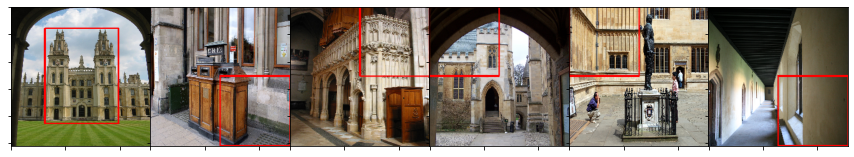

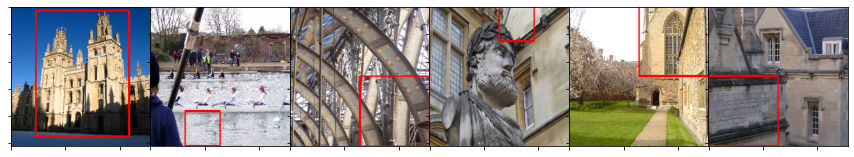

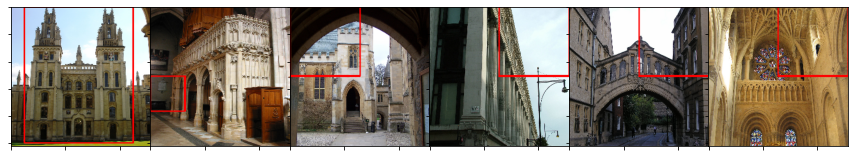

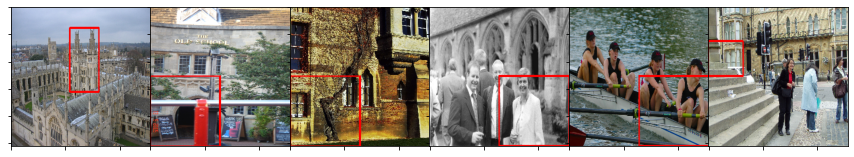

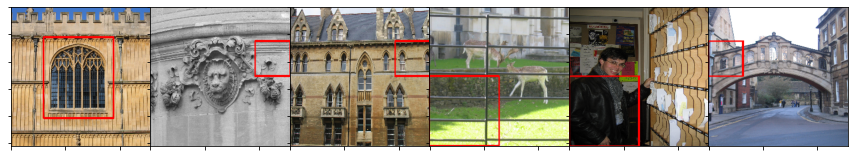

...

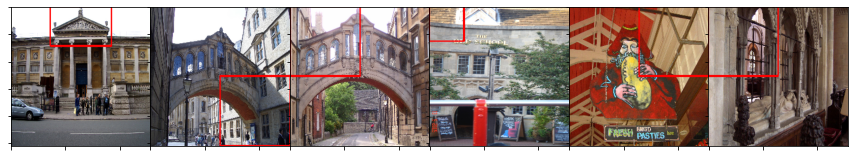

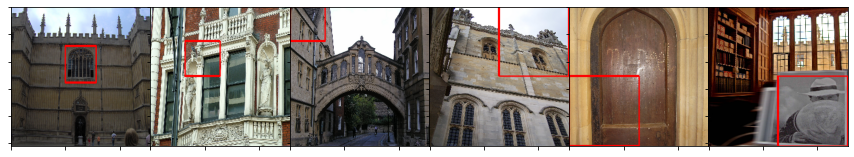

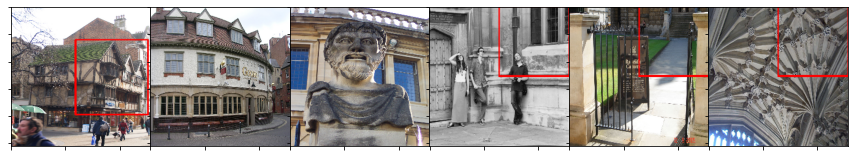

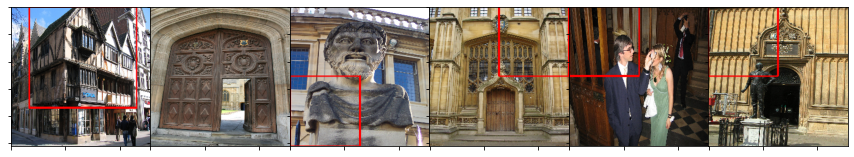

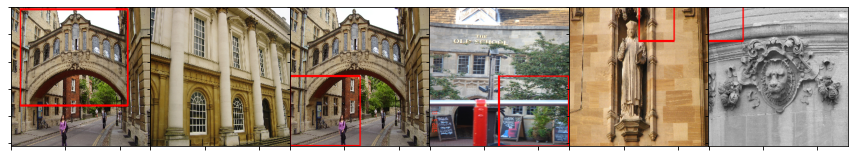

In [ ]:
keys = list(ground_truth.keys())
x_dim , y_dim = 128,128

map_test_scores = []
ndgc_scores = []

for idx, k in enumerate(keys):
  retrieve(k,dist_type)
  if idx%10 == 0:
    print("Number of Query images done :", idx+1, "out of :", len(keys), "Name : ", k)


In [25]:
print("DISTANCE METRIC :" ,'cosine')
# print("FOR COMPLETE DATASET : ", my_paths.datasetName)
print("MEAN AVERAGE PRECISION VALUE : ", np.array(map_test_scores).mean())

print("MEAN NORMALIZE DICOUNTED CUMMULATIVE GAIN ", np.array(ndgc_scores).mean())


DISTANCE METRIC : cosine
MEAN AVERAGE PRECISION VALUE :  0.02986877752738165
MEAN NORMALIZE DICOUNTED CUMMULATIVE GAIN  0.1796476742538318


# DEMO 

In [26]:
def get_image_using_path(image_name):
    img = cv2.imread(original_data_path+image_name)
    
    if img is None:
      img = cv2.imread(original_data_path+image_name)
    return img

def get_sift(img):
  
  kp, des = sift.detectAndCompute(img,None)
  return des

def get_hist(des, visual_words):
  return input_vector_encoder(des, visual_words)

## Obtain ranking for single image 

In [27]:
import cv2 
original_data_path = original_data_path
from matplotlib import pyplot as plt


def get_result(query_image_name,x1=None,y1=None,x2=None,y2=None):
  # finding results for a single image with the distance type given 
  plot_images = []
  plot_names = []
  plot_names_cor = []

  # adding '.jpg' to image name if not present 
  if query_image_name.find('.') == -1:
    query_image_name += '.jpg'

  # query image is np array image of query 
  query_image = get_image_using_path(query_image_name)

  if query_image is None:
    print('not found in test. finding in train set')
    query_image = get_image_using_path(query_image_name)
    if query_image is None:
      print('not found in train as well. stopping...')
      return

  # getting desctiption of query image if found 
  # plot images, names contain all np array,names [query, top image result 1 2 ..3..N]
  # Appending query images names and vlaues
  plot_images.append(query_image)
  plot_names.append(query_image_name)


  # gettion annotation if not given 
  if x1 is None:
    x1,y1,x2,y2 = ground_truth[query_image_name.split('.')[0]]['annotation']

  x1,y1,x2,y2 = float(x1), float(y1), float(x2), float(y2)

  height, width, channels = query_image.shape
  plot_names_cor.append([x1/width,y1/height,x2/width,y2/height])

  # getting descriptors for the query image 
  query_image = cv2.normalize(query_image, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
  des = get_sift(query_image)

  if des is None:
    print('no descriptor found for the query image')
  else:
    # creating historgram of query image 
    hist_of_query_image = get_hist(des, visual_words)

    # top indices of images 
    # RANKING ONE
   
    top_indices = topNmatches(np.array(hist_train),np.array(hist_of_query_image).reshape(1,-1),dist_type, 200)

    # Scored array 
    scores = [0]*len(top_indices)

    # RANKING TWO
    scores = []
    coordinates = []
    my_x1 , my_y1, my_x2, my_y2 = 0,0,0,0
    

    for idx, top_image_index in enumerate(top_indices):
      max = 0   
      img = get_image_using_path(reduce_train_names[top_image_index])

      all_wid = [(2,2),(4,4)]
      for (x_window, y_window) in all_wid:
        # x_window, y_window = 2, 2
        x_size, y_size = 0, 0
        for y_start in range(y_window):
          x_size = 0
          for x_start in range(x_window):

            crop_img = img[y_size:y_size+(y_dim//y_window), x_size:x_size+(x_dim//x_window)]
            
            if cv2.normalize(crop_img, None, 0, 255, cv2.NORM_MINMAX) is None:
              continue
            crop_img = cv2.normalize(crop_img, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
            des = get_sift(crop_img)

            if des is None:
              continue

            crop_img_histo = input_vector_encoder(des, visual_words)
            if (max <  1 - spatial.distance.cosine(hist_of_query_image, crop_img_histo)):
              max =  1 - spatial.distance.cosine(hist_of_query_image, crop_img_histo)
              my_x1 , my_y1 , my_x2, my_y2 = x_size ,y_size , x_size+(x_dim//x_window), y_size+(y_dim//y_window)
            x_size = x_size + (x_dim//x_window)
          y_size = y_size + (y_dim//y_window)
        
      scores.append(max)
      # rescale these later according to display image size 
      coordinates.append([my_x1/128,my_y1/128,my_x2/128,my_y2/128])

    zipped_lists = zip(scores, top_indices)
    sorted_pairs = sorted(zipped_lists)

    zipped_lists2 = zip(scores, coordinates)
    sorted_pairs2 = sorted(zipped_lists2)

    tuples = zip(*sorted_pairs)
    list1, list2 = [ list(t) for t in tuples]

    tuples2 = zip(*sorted_pairs2)
    list12, list22 = [ list(t) for t in tuples2]

    list1.reverse() , list2.reverse()
    list12.reverse() , list22.reverse()

    top_final_names = []

    for i in list2:
      image = get_image_using_path(reduce_train_names[i])
      plot_images.append(image)
      plot_names.append(reduce_train_names[i])

      top_final_names.append(reduce_train_names[i].split('.')[0])

    plot_names_cor.extend(coordinates)

    # Plotting figures
    fig, axs = plt.subplots(1,6, figsize=(15, 6), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)
    for i, ax in enumerate(axs.ravel()):
      # for each image in plot names read original image, height , width
      img = cv2.imread(original_data_path+ plot_names[i])
      H, W, Chan = img.shape   
      # coordinates rescaling according to orifinal image 
      p1 = (int(plot_names_cor[i][0]*W),int(plot_names_cor[i][1]*H))
      p2 = (int(plot_names_cor[i][2]*W),int(plot_names_cor[i][3]*H))

      # get bounding box image 
      img = get_bbx_image(img,p1,p2)
      
      # img = cv2.cvtColor(np.array(img_dict[plot_names[i]]), cv2.COLOR_BGR2RGB)
      plt.setp(ax.get_xticklabels(), visible=False)
      plt.setp(ax.get_yticklabels(), visible=False)
      ax.imshow(img)

    # fig, axs = plt.subplots(1,6, figsize=(15, 6), facecolor='w', edgecolor='k')
    # fig.subplots_adjust(hspace = .5, wspace=.001)
    # for ax, image in zip(axs.ravel(), images):
    #   img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #   plt.setp(ax.get_xticklabels(), visible=False)
    #   plt.setp(ax.get_yticklabels(), visible=False)
    #   ax.imshow(img)
    # plt.show()

    # EVALUATION 
    # MAP computation for one image
    eval_arr = get_map(query_image_name,top_final_names)
   
    # nDGC computation for one image 
    eval_arr2 = DGC_get_map(query_image_name,top_final_names)
 
    print("PRECISION VALUE : ", find_MAP(eval_arr,20))

    print("NORMALIZE DICOUNTED CUMMULATIVE GAIN ", compute_ndcg_at_k(eval_arr2, len(eval_arr2), m='f1'))


## Displaying all ground truth images with baounding box 

In [28]:
def Display_all_ground_truth_images(ground_truth):
  names_list = []
  names_list_cord = []
  #  contains all raw names 
  options = []
  counter = -1

  def resize_img(temp,img):
    # img is already read here and temp contains original coordinates of boxes 
    H, W, Chan = img.shape 
    (x1,y1,x2,y2)  = temp
    # coordinates rescaling according to orifinal image 
    p1 = (int(x1),int(y1))
    p2 = (int(x2),int(y2))
    # print(p1,p2)
    # get bounding box image 
    return get_bbx_image(img,p1,p2)
    # return cv2.resize(img, dsize=(256, 256), interpolation=cv2.INTER_CUBIC)


  for idx, x in enumerate(ground_truth.keys()):

    x1,y1,x2,y2 = ground_truth[x]['annotation']
    x1,y1,x2,y2 = float(x1), float(y1), float(x2), float(y2)

    img = cv2.imread(original_data_path+ x+'.jpg')
    names_list.append(img)
    names_list_cord.append((x1,y1,x2,y2))
    options.append(x)

    if (idx+1)%5==0:
      
      fig, (ax1, ax2,ax3,ax4,ax5) = plt.subplots(1, 5, figsize=(10, 8))
      counter += 1
      if counter*5 + 0 < len(names_list):
        ax1.imshow(resize_img(names_list_cord[counter*5 + 0],names_list[counter*5 + 0]))
      if counter*5 + 1 < len(names_list):
        ax2.imshow(resize_img(names_list_cord[counter*5 + 1],names_list[counter*5 + 1]))
      if counter*5 + 2 < len(names_list):
        ax3.imshow(resize_img(names_list_cord[counter*5 + 2],names_list[counter*5 + 2])) 
      if counter*5 + 3 < len(names_list):
        ax4.imshow(resize_img(names_list_cord[counter*5 + 3],names_list[counter*5 + 3]))
      if counter*5 + 4 < len(names_list):
        ax5.imshow(resize_img(names_list_cord[counter*5 + 4],names_list[counter*5 + 4]))
      
      ax1.xaxis.set_visible(False)
      ax1.yaxis.set_visible(False)

      ax2.xaxis.set_visible(False)
      ax2.yaxis.set_visible(False)

      ax3.xaxis.set_visible(False)
      ax3.yaxis.set_visible(False)

      ax4.xaxis.set_visible(False)
      ax4.yaxis.set_visible(False)

      ax5.xaxis.set_visible(False)
      ax5.yaxis.set_visible(False)

      ax1.title.set_text("Index : " + str(counter*5 + 0+1))
      ax2.title.set_text("Index : "+ str(counter*5 + 1+1))
      ax3.title.set_text("Index : "+ str(counter*5 + 2+1))
      ax4.title.set_text("Index : "+ str(counter*5 + 3+1))
      ax5.title.set_text("Index : " + str(counter*5 + 4+1))

  if len(list(ground_truth.keys()))%5!=0:
    fig, (ax1, ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(10, 8))
    counter = (len(list(ground_truth.keys()))//5)

    if counter*5 + 0 < len(names_list):
      ax1.imshow(resize_img(names_list_cord[counter*5 + 0],names_list[counter*5 + 0]))
      ax1.xaxis.set_visible(False)
      ax1.yaxis.set_visible(False)
      ax1.title.set_text("Index : " + str(counter*5 + 0+1))
    else:
      ax1.axis('off')

    if counter*5 + 1 < len(names_list):
      ax2.imshow(resize_img(names_list_cord[counter*5 + 1],names_list[counter*5 + 1]))
      ax2.xaxis.set_visible(False)
      ax2.yaxis.set_visible(False)
      ax2.title.set_text("Index : "+ str(counter*5 + 1+1))
    else:
      ax2.axis('off')

    if counter*5 + 2 < len(names_list):
      ax3.imshow(resize_img(names_list_cord[counter*5 + 2],names_list[counter*5 + 2])) 
      ax3.title.set_text("Index : "+ str(counter*5 + 2+1))
      ax3.xaxis.set_visible(False)
      ax3.yaxis.set_visible(False)
    else:
      ax3.axis('off')

    if counter*5 + 3 < len(names_list):
      ax4.imshow(resize_img(names_list_cord[counter*5 + 3],names_list[counter*5 + 3]))
      ax4.title.set_text("Index : "+ str(counter*5 + 3+1))
      ax4.xaxis.set_visible(False)
      ax4.yaxis.set_visible(False)
    else:
      ax4.axis('off')
  return options, names_list_cord 


## Displaying a single Image 

In [29]:
def Display_one_image(img,x1=None,y1=None,x2=None,y2=None):
  # img is after imread 
  if x1 is None:
    plt.title('IMAGE')
    plt.imshow(cv2.resize(img, dsize=(256, 256), interpolation=cv2.INTER_CUBIC))
  else:
    H, W, Chan = img.shape 
    # coordinates rescaling according to orifinal image 
    p1 = (int(x1),int(y1))
    p2 = (int(x2),int(y2))
    plt.title('SELECTED IMAGE WITH BOX')
    plt.imshow(get_bbx_image(img,p1,p2))
    ax = plt.gca()
    ax.axes.xaxis.set_ticks([])
    ax.axes.yaxis.set_ticks([])


## Final function for demo

In [30]:
def get_results():

  #  Displaying all   
  options,names_list_cord = Display_all_ground_truth_images(ground_truth)
  plt.pause(0.001)
  x = int(input('Enter a choice: '))
  selected_img_array = cv2.imread(original_data_path+ options[x-1]+'.jpg')
  
  height, width, channels =  cv2.imread(original_data_path+ options[x-1]+'.jpg').shape  
  choice = input(f'Provide annotations [x1, y1, x2, y2] between (0,0) - {width, height} (Y/N): ?\n').lower()
  if choice == 'y':
    x1, y1, x2, y2 = list(map(float, input().split()))
    
    Display_one_image(selected_img_array,x1,y1,x2,y2)

  else:
    x1, y1, x2, y2 = None, None, None, None
    
    x_1,y_1,x_2,y_2  = names_list_cord[x-1][0],names_list_cord[x-1][1],names_list_cord[x-1][2],names_list_cord[x-1][3]
    Display_one_image(selected_img_array,x_1,y_1,x_2,y_2)
     
  get_result(options[x-1], x1, y1, x2, y2)

# Take Demo 

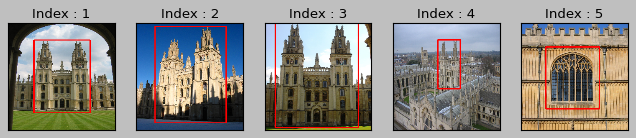

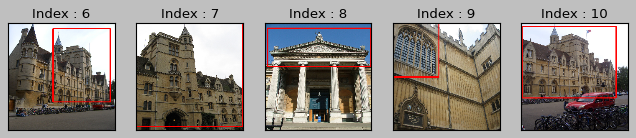

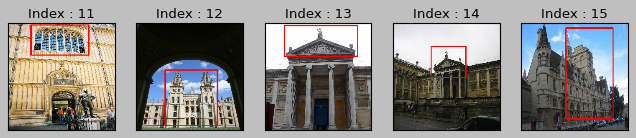

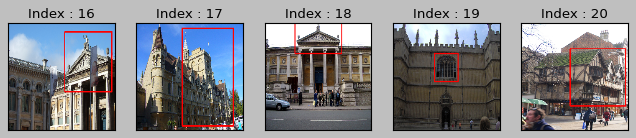

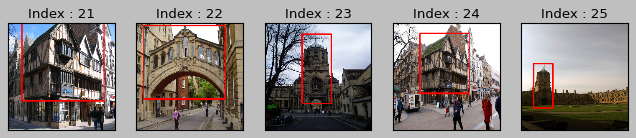

...

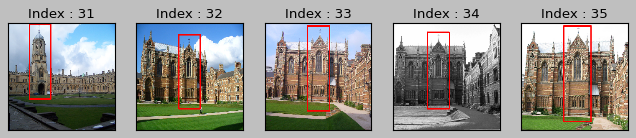

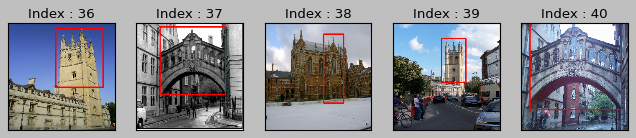

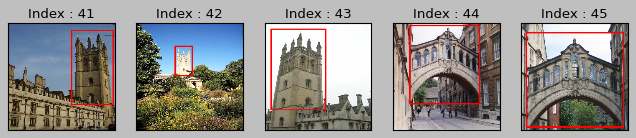

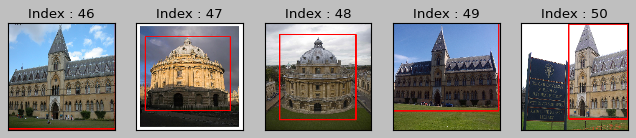

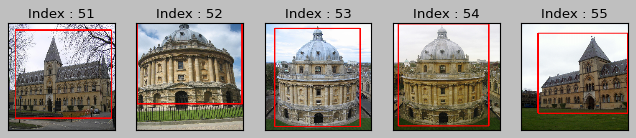

Enter a choice: 52
Provide annotations [x1, y1, x2, y2] between (0,0) - (768, 1024) (Y/N): ?
n
PRECISION VALUE :  0.03457205860677327
NORMALIZE DICOUNTED CUMMULATIVE GAIN  0.3435709111439714


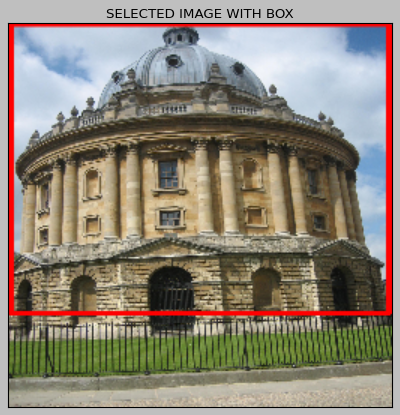

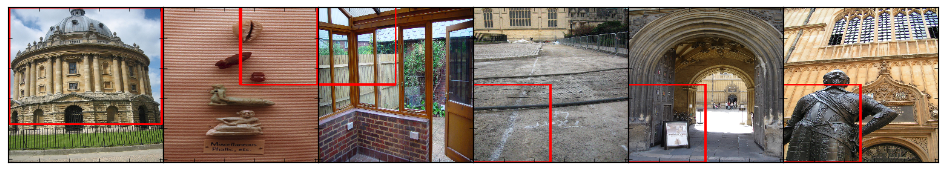

In [32]:
import warnings 
warnings.filterwarnings("ignore")

plt.style.use("classic")
plt.rcParams.update({'font.size': 10})
get_results()